In [1]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from matplotlib import colors
import matplotlib as mpl 
mpl.rcParams["image.origin"] = 'lower'
# mpl.rcParams["image.dpi"] = 200
import os
import numpy as np1
import pandas as pd

import mplhep as hep
plt.style.use(hep.style.CMS)

In [2]:
input_folder = "/eos/user/r/rdfexp/ecal/cluster/output_deepcluster_dumper/reco_comparison/supercluster_regression/electrons"
output_folder = "/eos/user/d/dvalsecc/www/ECAL/Clustering/DeepCluster/RecoPlots/RecoComparison_regression_UL18_v8_SCregression/fits_eta_et"
os.makedirs(output_folder, exist_ok=True)


In [3]:
reco = "DeepSC_AlgoA"
df_1 = pd.HDFStore(f"{input_folder}/ele_UL18_123X_Mustache_v8_object.h5py", "r")["df"]
df_2 = pd.HDFStore(f"{input_folder}/ele_UL18_123X_{reco}_v8_object.h5py", "r")["df"]
df_1.rename(columns={"output_object.csv":"calomatched"}, inplace=True)
df_2.rename(columns={"output_object.csv":"calomatched"}, inplace=True)
df_1.rename(columns={"ncsl_tot":"ncls_tot"}, inplace=True)
df_2.rename(columns={"ncsl_tot":"ncls_tot"}, inplace=True)
df_1 = df_1.iloc[:-1]
df_2 = df_2.iloc[:-1]

df_1["Eraw_ov_Esim"] = df_1.en_sc_raw / df_1.calo_en_sim
df_1["Ecorr_ov_Esim"] = df_1.en_sc_calib / df_1.calo_en_sim
df_2["Eraw_ov_Esim"] = df_2.en_sc_raw / df_2.calo_en_sim
df_2["Ecorr_ov_Esim"] = df_2.en_sc_calib / df_2.calo_en_sim

df_1["Eraw_ov_EGen"] = df_1.en_sc_raw / df_1.genpart_en
df_1["Ecorr_ov_EGen"] = df_1.en_sc_calib / df_1.genpart_en
df_2["Eraw_ov_EGen"] = df_2.en_sc_raw / df_2.genpart_en
df_2["Ecorr_ov_EGen"] = df_2.en_sc_calib / df_2.genpart_en

df_1.rename(columns={"sc_index": "old_index"}, inplace=True)
df_2.rename(columns={"sc_index": "new_index"}, inplace=True)


df_join = df_1.merge(df_2, on=["runId","eventId","caloindex"], suffixes=["_old", "_new"],indicator=True)

## Resolution

In [4]:
def bin_analysis(col):
    def f(df):
        m = df[col].mean()
        A = (df[col].quantile(0.84) - df[col].quantile(0.16))/2
        B = (df[col].quantile(0.975) - df[col].quantile(0.025))/2
        return pd.Series({
            "m": m,
            "w68": A,
            "w95": B,
            "N": df[col].count()
        })
    return f

def bin_analysis_details(col):
    def f(df):
        m = df[col].mean()
        qu = df[col].quantile(0.84)
        qd = df[col].quantile(0.16)
        A = (qu - qd)/2
        quu = df[col].quantile(0.975)
        qdd = df[col].quantile(0.025)
        B = (quu- qdd )/2
        return pd.Series({
            "m": m,
            "w68": A,
            "w95": B,
            "w68_u": qu,
            "w68_d": qd,
            "w95_u" : quu,
            "w95_d" : qdd,
            "N": df[col].count()
        })
    return f


def get_quantiles(df):
    return df.quantile(0.025), df.quantile(0.16), df.quantile(0.5), df.quantile(0.84), df.quantile(0.975)


def movingaverage(interval, window_size):
    window= np.ones(int(window_size))/float(window_size)
    return np.convolve(interval, window, 'same')

from numba import jit

@jit(nopython=True)
def get_central_smallest_interval(df, xrange, nbins, Ntrial=10000, perc=0.68):
    H = np.histogram(df, bins=nbins, range=xrange)
    
    #xx = movingaverage(H[0], 10)
    
    xmax = H[1][np.argmax(H[0])]
    
    #xmax = np.mean(df[(df>=xrange[0]) & (df<xrange[1])])
    deltax = (xrange[1]-xrange[0])/(2*Ntrial)
    
    N = df.size
    xd = xmax-deltax
    xu = xmax+deltax
    for i in range(Ntrial):
        q = np.sum((df>xd) &(df<xu))/ N
        if q>=perc: 
            break
        xd = xd-deltax
        xu = xu+deltax
    return xmax, xd, xu

def bin_analysis_central_smallest(col, xrange=(0.6, 1.2), nbins=200, Ntrial =10000):
    def f(df):
        data = df[col]
        xmax, qd, qu = get_central_smallest_interval(data.values, xrange=xrange, nbins=nbins, Ntrial =Ntrial )
        return pd.Series({
            "m": xmax,
            "w68": (qu-qd)/2,
            "w68_u": qu,
            "w68_d": qd,
            "N": df[col].count()
        })
    return f

## Dynamic fit function

The best fit range is extracted by first looking for the maximum and then getting the 95% central interval around it. 

In [5]:
from numba import jit 

@jit
def cruijff(x, A, m, sigmaL,sigmaR, alphaL, alphaR):
    dx = (x-m)
    SL = np.full(x.shape, sigmaL)
    SR = np.full(x.shape, sigmaR)
    AL = np.full(x.shape, alphaL)
    AR = np.full(x.shape, alphaR)
    sigma = np.where(dx<0, SL,SR)
    alpha = np.where(dx<0, AL,AR)
    f = 2*sigma*sigma + alpha*dx*dx ;
    return A* np.exp(-dx*dx/f) 

from scipy.optimize import curve_fit

def fit_cruijff(data, bins, xrange):
    H= np.histogram(data,bins=bins, range=xrange)
    x = H[1][:-1]
    Y = H[0]
    # delete empty bins
    x = x[Y>0]
    Y =Y[Y>0]
    params, pcovs = curve_fit(cruijff, x, Y, p0=[np.max(Y), 1, 0.02, 0.02,  0.15,0.15], 
                              sigma=np.sqrt(Y),absolute_sigma=True)
    return params, pcovs
    
    
def bin_analysis_cruijff(col, nbins=300, prange=0.95):
    def f(df):
        data = df[col].values
        # use the mode looking function to get a meaninful interval centered around the maximum and no tails
        # we just need a rought center estimate
        mean, xd, xu = get_central_smallest_interval(data, xrange=(0.6,1.3), nbins=200, perc=prange)
        
        try:
            params, pcovs = fit_cruijff(data, bins=nbins, xrange=(xd, xu) )
            perr = np.sqrt(np.diag(pcovs))

            return pd.Series({
                "m": params[1],
                "sigmaL": params[2], 
                "sigmaR": params[3],
                "alphaL": params[4],
                "alphaR": params[5],
                "m_err": perr[1],
                "sigmaL_err": perr[2], 
                "sigmaR_err": perr[3],
                "alphaL_err": perr[4],
                "alphaR_err": perr[5],
                "A": params[0],
                "A_err": perr[0],
                "N": df[col].count(),
                "xmin": xd,
                "xmax": xu
            })
        except:
            print("Fit failed")
            return pd.Series({
                "m": mean,
                "sigmaL": -1, 
                "sigmaR": -1,
                "alphaL": -1,
                "alphaR": -1,
                "m_err": -1,
                "sigmaL_err": -1, 
                "sigmaR_err": -1,
                "alphaL_err": -1,
                "alphaR_err": -1,
                "A": -1,
                "A_err": -1,
                "N": df[col].count(),
                "xmin": xd,
                "xmax": xu
            })
    return f


### Test the fit

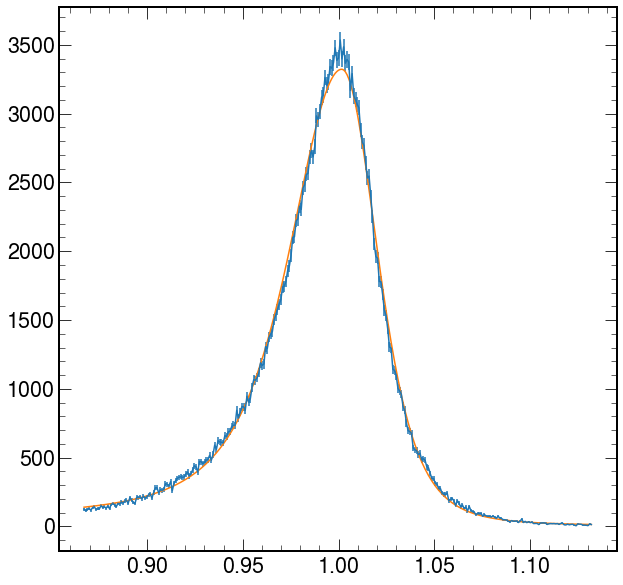

In [26]:
bins= 300
var = "Ecorr_ov_EGen"
emin = 10
emax = 100
eta_min = 1
eta_max = 1.479


dfx_must = df_join[(df_join.seed_eta_old.abs()>eta_min)&(df_join.seed_eta_old.abs()<eta_max)&(df_join.et_seed_old>=emin)&(df_join.et_seed_old<emax)][var+"_old"]
dfx_deep = df_join[(df_join.seed_eta_new.abs()>eta_min)&(df_join.seed_eta_new.abs()<eta_max)&(df_join.et_seed_new>=emin)&(df_join.et_seed_new<emax)][var+"_new"]
    
mean, xd, xu = get_central_smallest_interval(dfx_deep.values, xrange=(0.5, 1.5), nbins=250, perc=0.95)
    
xrange = (xd,xu)
H= np.histogram(dfx_deep,bins=bins, range=xrange)

x = H[1][:-1]
Y = H[0]

x = x[Y>0]
Y =Y[Y>0]

params, covs = curve_fit(cruijff, x, Y, p0=[np.max(Y), 1,  0.02, 0.02,  0.25,0.25], 
                         sigma=np.sqrt(Y),absolute_sigma=True)

y = cruijff(x, *params)
plt.errorbar(x, Y, np.sqrt(Y),0)
plt.plot(x, y)

### Plot the fit for all the bins

In [119]:
ets = [4, 8, 12,16, 20,25 ,30,35,40, 45, 50, 60, 70, 80, 90 ,100]
etas = [0, 0.5,0.8,1.0,1.2, 1.485, 1.566, 1.75, 2.,2.25,2.5,3]

name = "ele_gen_matched_corr"
flavour = "Electron \n(GEN-matched)"
df = df_join
res_var = "Ecorr_ov_EGen"
res_label = "$\sigma (E_{Calib}/E_{Gen})$"

df["et_bin"] = pd.cut(df.calo_et_gen_new, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.calo_simeta_new.abs(), etas, labels=list(range(len(etas)-1)))



In [150]:
def do_plot(df_join, ets, etas, output, nbins=300, prange=0.9):
    for iet in range(len(ets)-1):
        for ieta in range(len(etas)-1):
            df = df_join[(df_join.et_bin == iet)&(df_join.eta_bin==ieta)]
            fit_deep = bin_analysis_cruijff(f"{res_var}_new", nbins=nbins, prange=prange)
            fit_must = bin_analysis_cruijff(f"{res_var}_old", nbins=nbins, prange=prange)
            try:
                res_deep = fit_deep(df)
                res_must = fit_must(df)
            except:
                print(f"Fit failed et=[{ets[iet]},{ets[iet+1]}], eta=[{etas[ieta]},{etas[ieta+1]}]")
                return

            fig = plt.figure(figsize=(9,8), dpi=100)
            ax = plt.gca()



            H_m = np.histogram(df[f"{res_var}_old"],bins=nbins, range=(res_must.xmin, res_must.xmax))
            xm = H_m[1][:-1]
            Ym = H_m[0]
            ax.errorbar(xm, Ym, np.sqrt(Ym),0, linestyle='none',fmt=".", label="Mustache")


            H_d = np.histogram(df[f"{res_var}_new"],bins=nbins, range=(res_deep.xmin, res_deep.xmax))
            xd = H_d[1][:-1]
            Yd = H_d[0]
            ax.errorbar(xd, Yd, np.sqrt(Yd),0, linestyle='none', fmt=".",label="DeepSC")


            y_cr_D = cruijff(xd, res_deep.A, res_deep.m, res_deep.sigmaL, res_deep.sigmaR, res_deep.alphaL, res_deep.alphaR)
            y_cr_M = cruijff(xm, res_must.A, res_must.m, res_must.sigmaL, res_must.sigmaR, res_must.alphaL, res_must.alphaR)
            ax.plot(xm, y_cr_M, label="Cruijiff Mustache", linewidth=2)
            ax.plot(xd, y_cr_D, label="Cruijiff DeepSC", linewidth =2)

            ax.legend(loc="upper right", bbox_to_anchor=(1, 1), fontsize=18)


            ax.text(0.05, 0.9, f"DeepSC:\nm={res_deep.m:.3f}, $\sigma_L$={res_deep.sigmaL:.3f}, $\sigma_R$={res_deep.sigmaR:.3f}",
                    transform=ax.transAxes, fontsize=15, color="orange")
            ax.text(0.05, 0.8, f"Mustache:\nm={res_must.m:.3f}, $\sigma_L$={res_must.sigmaL:.3f}, $\sigma_R$={res_must.sigmaR:.3f}",
                    transform=ax.transAxes, fontsize=15, color="blue")

            ax.text(0.05, 0.65, f"$E_T^{{Gen}}$ [{ets[iet]},{ets[iet+1]}] GeV\n$\eta$: [{etas[ieta]},{etas[ieta+1]}]",
                    transform=ax.transAxes, fontsize=17)

            ax.set_ylim(0,max(Yd)*1.3)

            ax.set_xlabel("$E_{calib}/E_{Gen}$")

            hep.cms.label(rlabel="14 TeV", loc=0, ax=ax)

            if (output):
                fig.savefig(output + f"/cruijff_fit_EcorrOvEGen_et{ets[iet]}_{ets[iet+1]}_eta{etas[ieta]}_{etas[ieta+1]}.png")
                fig.savefig(output + f"/cruijff_fit_EcorrOvEGen_et{ets[iet]}_{ets[iet+1]}_eta{etas[ieta]}_{etas[ieta+1]}.pdf")
                fig.savefig(output + f"/cruijff_fit_EcorrOvEGen_et{ets[iet]}_{ets[iet+1]}_eta{etas[ieta]}_{etas[ieta+1]}.svg")
            plt.close()

Fit failed et=[8,12], eta=[1.485,1.566]


/tmp/ipykernel_516/3134783074.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(9,8), dpi=100)
/cvmfs/sft.cern.ch/lcg/views/LCG_101swan/x86_64-centos7-gcc8-opt/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


Fit failed et=[12,16], eta=[1.485,1.566]


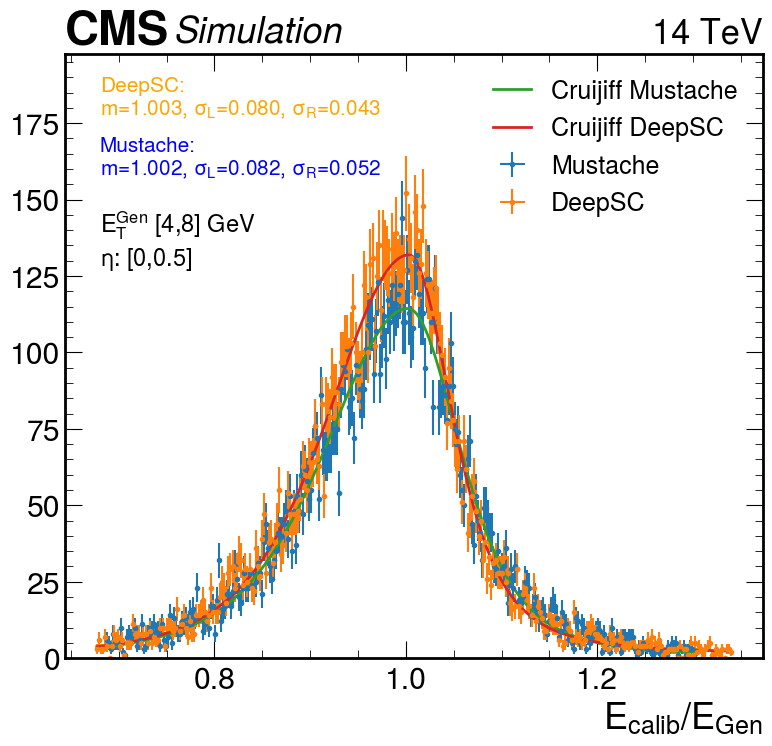

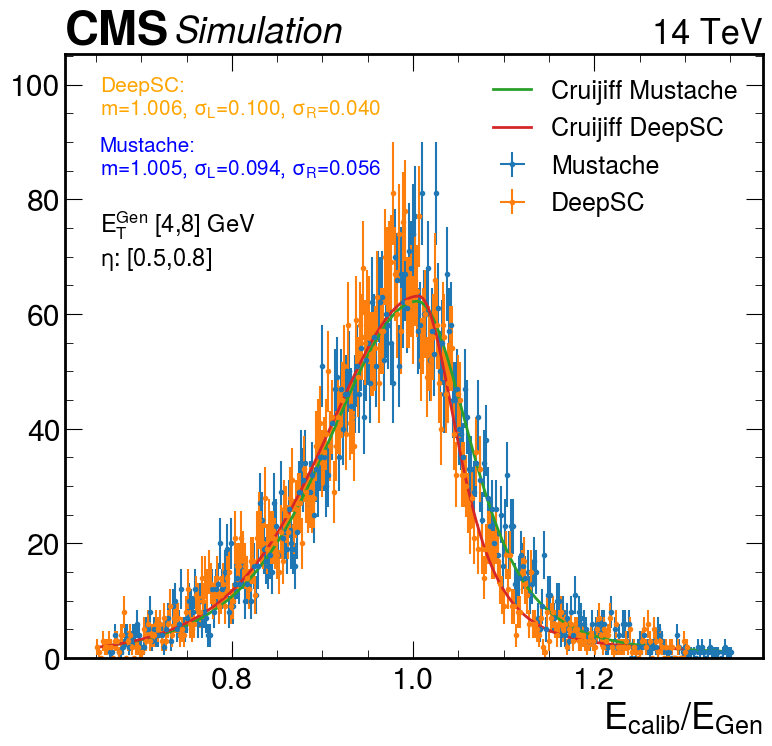

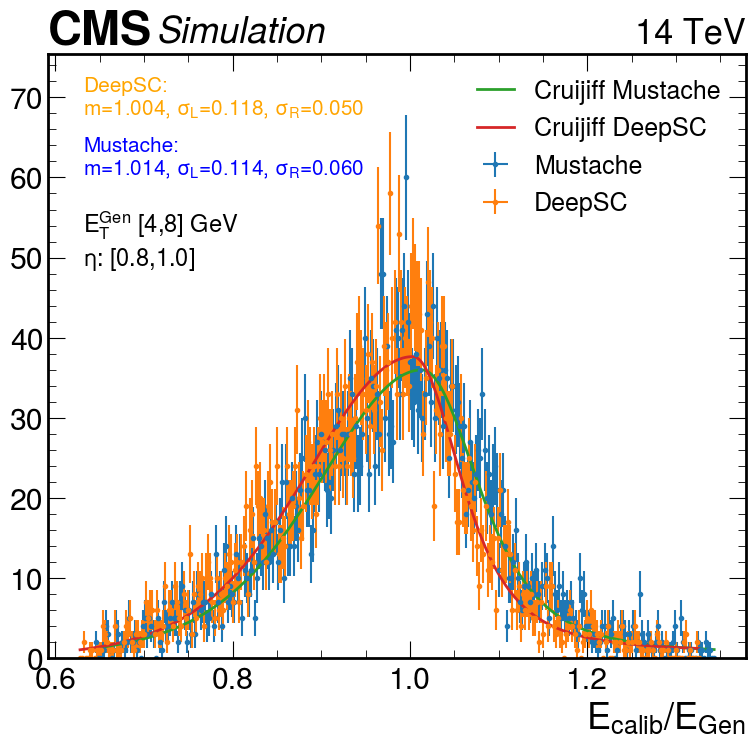

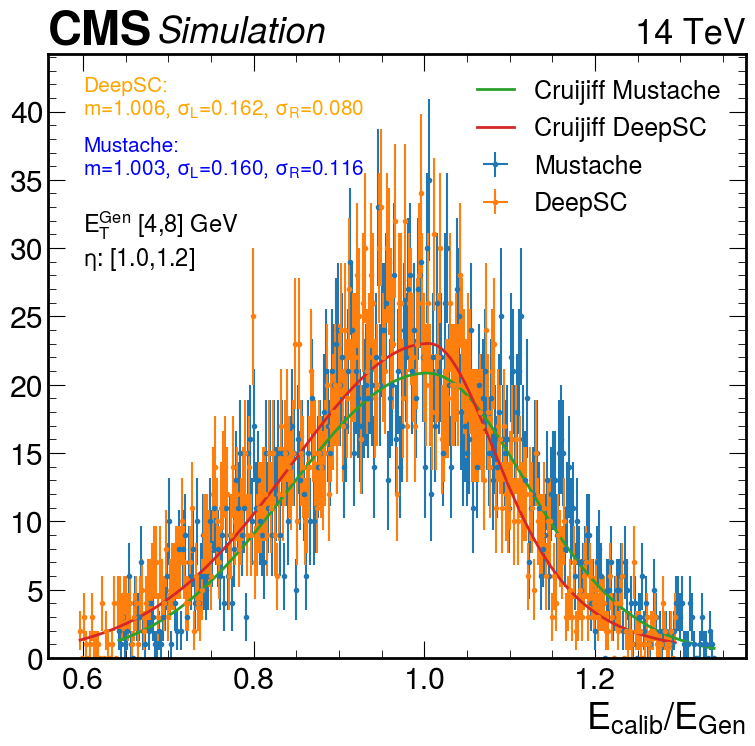

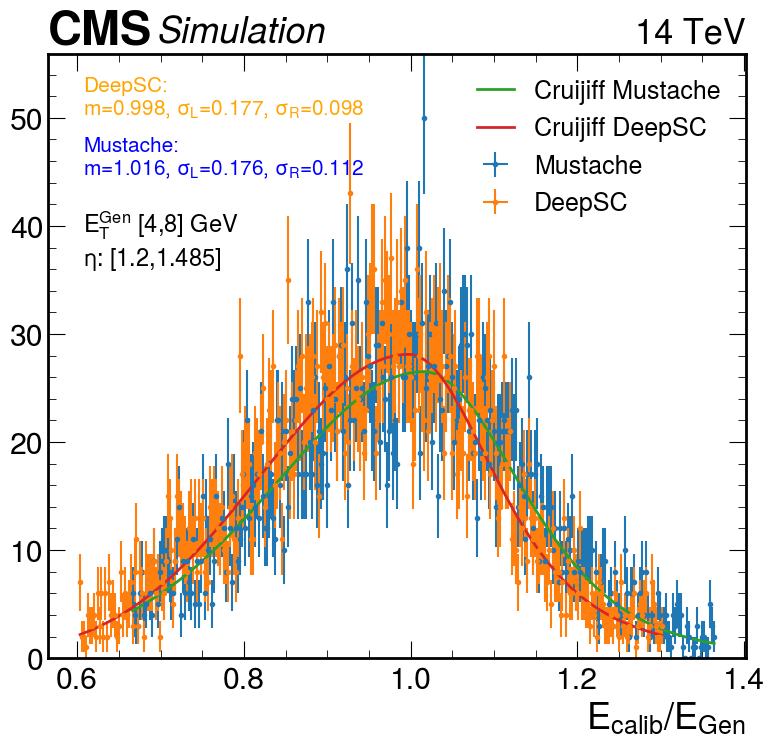

...

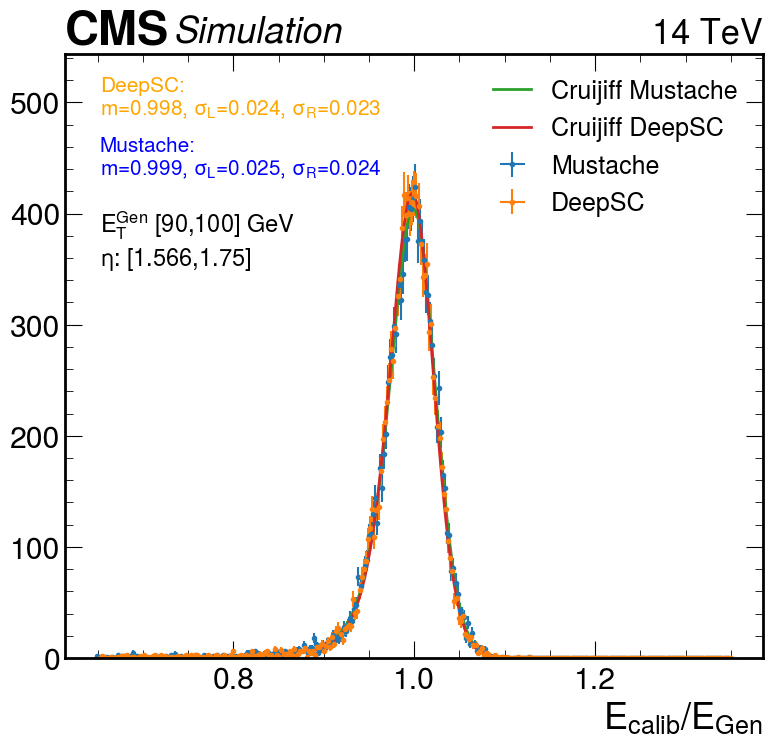

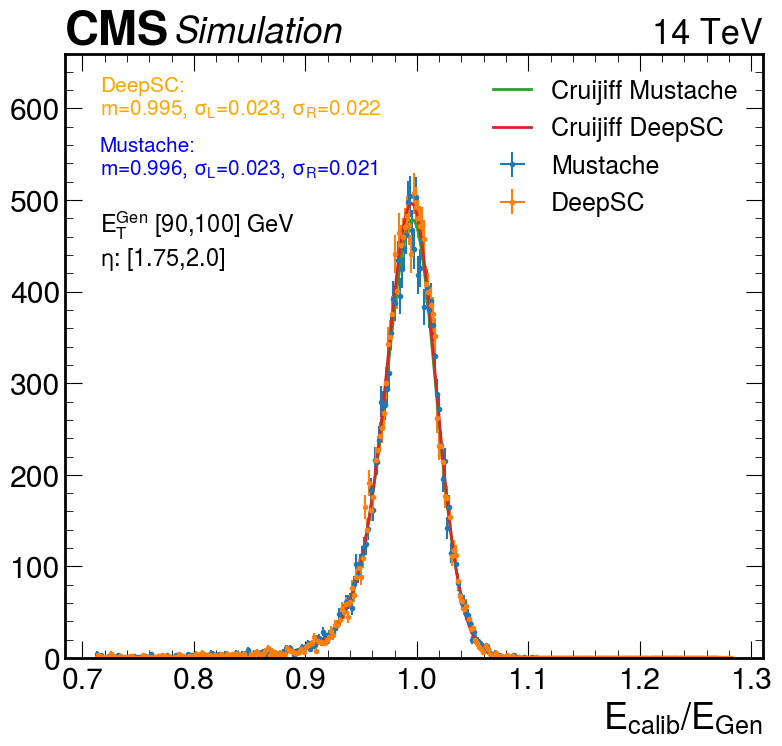

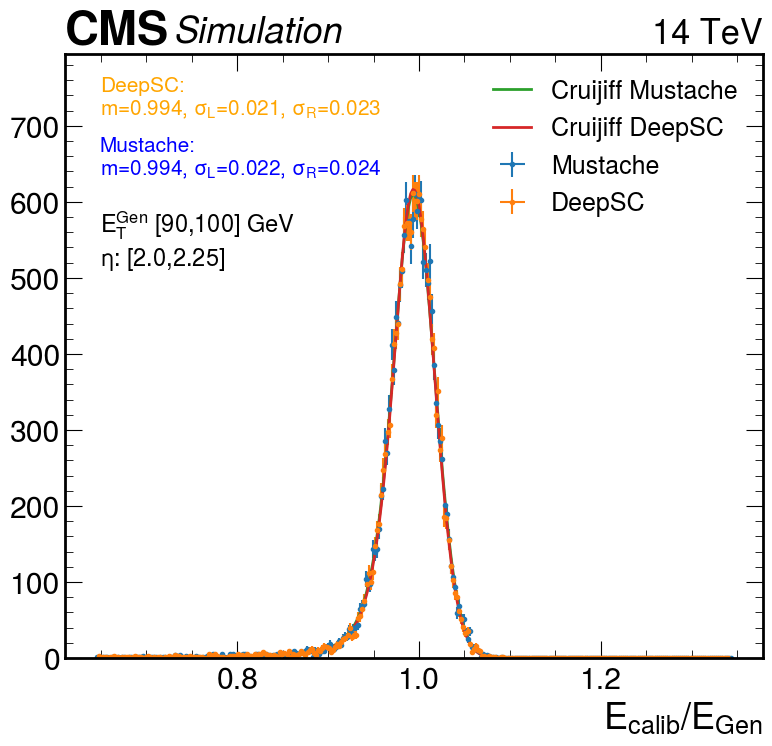

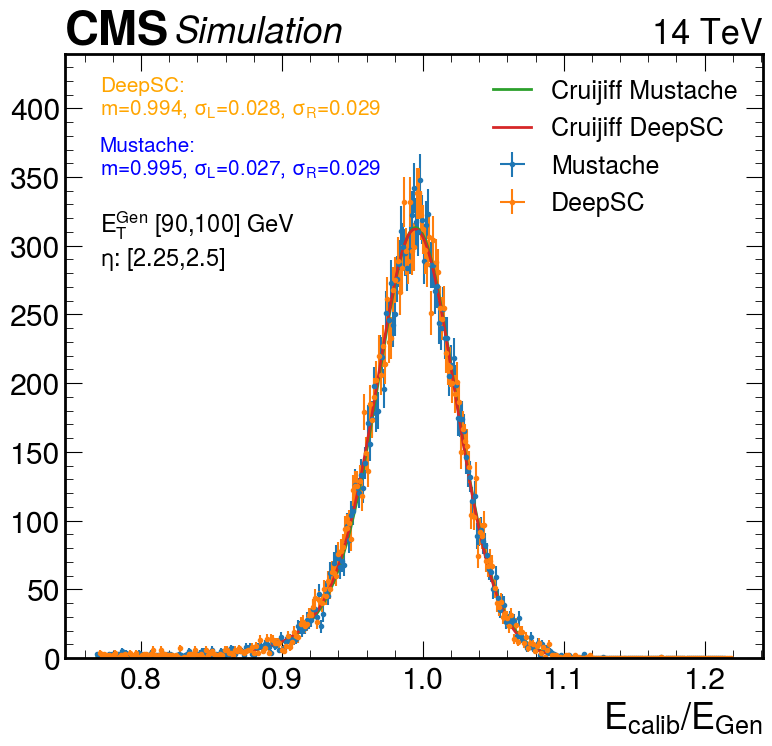

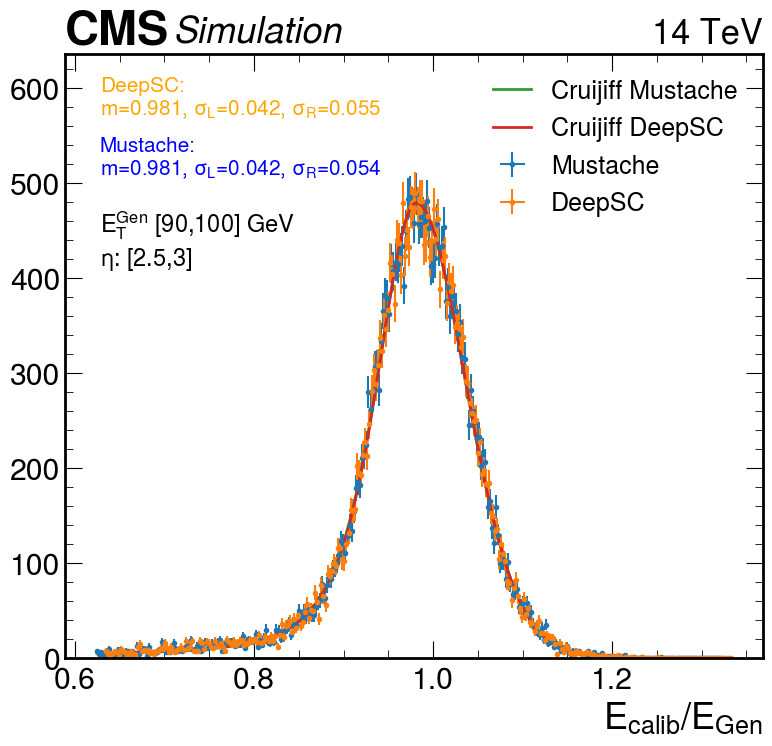

In [130]:
do_plot(df_join, ets, etas, output=output_folder, nbins=250, prange=0.98)

## Summary plots

### Plot by eta

In [159]:
ets = [4,10, 15,25, 40,60]
iplot = [0, 1, 2, 3,4 ]
#etas = [0, 0.3,0.6,0.9,1.2, 1.485, 1.566, 1.75, 2.,2.25,2.5,2.75,3]
etas = [0, 0.5,0.8,1.0,1.2, 1.485, 1.566, 1.75, 2.,2.25,2.5,3]
exclude_bin = 5
nbins_fit = 250
prange= 0.98

name = "ele_gen_matched_corr"
flavour = "Electron \n(GEN-matched)"
df = df_join
res_var = "Ecorr_ov_EGen"


df["et_bin"] = pd.cut(df.calo_et_gen_new, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.seed_eta_new.abs(), etas, labels=list(range(len(etas)-1)))


res = df_join.groupby(["et_bin","eta_bin"]).apply(bin_analysis_cruijff(f"{res_var}_new", nbins=nbins_fit, prange=prange))
res_must = df_join.groupby(["et_bin","eta_bin"]).apply(bin_analysis_cruijff(f"{res_var}_old", nbins=nbins_fit, prange=prange))
#     avgenraw = df.groupby(["et_bin","eta_bin"]).agg({"en_true_sim_good": "mean"})
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


Fit failed


In [160]:
do_plot(df_join, ets, etas, output=output_folder, nbins=250, prange=0.98)

Fit failed
Fit failed


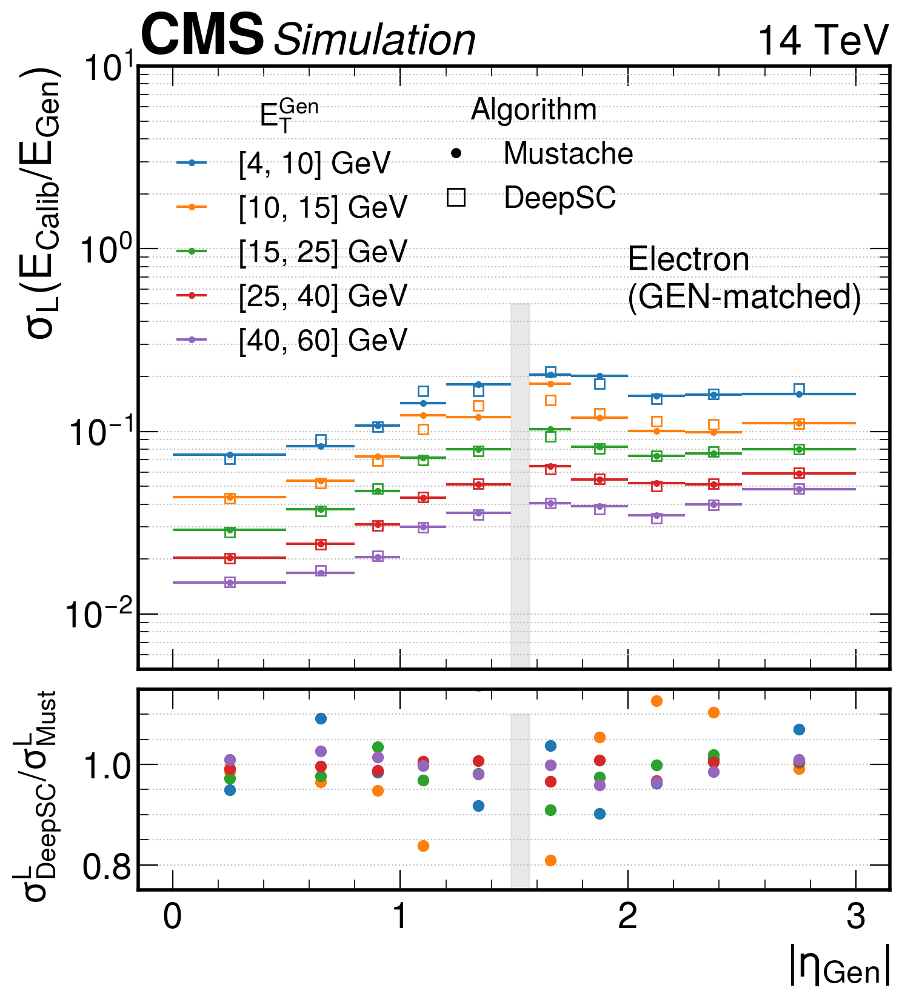

In [165]:
## Sigma LEFT plot
res_label = "$\sigma_L (E_{Calib}/E_{Gen})$"
res["w68"] = res.sigmaL
res_must["w68"] = res_must.sigmaL
#     avgenraw.reset_index(level=0, inplace=True)
#     avgenraw.reset_index(level=0, inplace=True)

fig = plt.figure(figsize=(8,9), dpi=200)
gs = fig.add_gridspec(2, hspace=0.05, height_ratios=[0.75,0.25])
axs = gs.subplots(sharex=True)

errx = []
x = []
for i in range(len(etas)-1):
    errx.append((etas[i+1]- etas[i])/2)
    x.append((etas[i+1]+ etas[i])/2)

mustl = []
deepl = []

res.loc[res.eta_bin == exclude_bin, ["w68"]] = 0
res_must.loc[res_must.eta_bin == exclude_bin, ["w68"]] = 0

for iet, et in enumerate(ets[:-1]):
    if iet not in iplot: continue
    l = axs[0].errorbar(x, res_must[res_must.et_bin == iet].w68, xerr=errx, label="[{}, {}] GeV".format(ets[iet], ets[iet+1]), fmt = ".")
    mustl.append(l)

i = 0
for iet, et in enumerate(ets[:-1]):
    if iet not in iplot: continue
    l = axs[0].errorbar(x, res[res.et_bin == iet].w68,  xerr=errx ,label="[{}, {}] GeV".format(ets[iet], ets[iet+1]), 
                            c=mustl[i].lines[0].get_color(), marker="s", markerfacecolor='none', linestyle='none',elinewidth=0)
    i+=1
    deepl.append(l)

axs[0].fill_between([1.485, 1.566], [5e-3,5e-3],[0.5,0.5], color="lightgray", alpha=0.5)

for iet, et in enumerate(ets[:-1]):
    if iet not in iplot: continue
    #v =res_must[res_must.et_bin == iet].w68**2 - res[res.et_bin == iet].w68**2
    #var = np.sqrt(np.abs(v))*np.sign(v) / res_must[res_must.et_bin == iet].w68
    var = res[res.et_bin==iet].w68 / res_must[res_must.et_bin==iet].w68
    axs[1].errorbar(x, var,xerr=errx, label="$E_T^{Gen} $" + " [{}, {}] GeV".format(ets[iet], ets[iet+1]),  fmt="o", linestyle='none', elinewidth=0)

axs[0].set_ylabel(res_label)

l1= axs[0].legend(handles=mustl, title="$E_T^{Gen}$", title_fontsize=18, loc="upper left", fontsize=18)

ml = mlines.Line2D([], [], color='black', marker='.', linestyle='None', markersize=10, label='Mustache')
dl = mlines.Line2D([], [], color='black', marker='s', markerfacecolor='none', linestyle='None', markersize=10, label='DeepSC')
axs[0].legend(handles=[ml,dl], title="Algorithm", title_fontsize=18, loc="upper right", bbox_to_anchor=(0.7, 1), fontsize=18)
axs[0].add_artist(l1)

axs[1].set_xlabel("$|\eta_{Gen}|$")
axs[0].set_ylim(5e-3,1e1)
# ax.plot([0,100],[1,1], linestyle="dashed", color="black")

axs[1].set_ylim(0.75, 1.15)
axs[1].set_ylabel("$\sigma_{DeepSC}^L/\sigma_{Must}^L$", fontsize=22)
axs[0].get_yaxis().set_label_coords(-0.1,1)
axs[1].get_yaxis().set_label_coords(-0.1,1)

axs[1].fill_between([1.485, 1.566], [-0.1,-0.1],[1.1,1.1], color="lightgray", alpha=0.5)

#     axs[1].legend(ncol=3,prop={'size': 13}, loc="lower left" )

axs[0].text(0.65, 0.6, flavour, transform=axs[0].transAxes, fontsize=20)

axs[0].set_yscale("log")
axs[0].grid(which="both",axis="y")
axs[1].grid(which="both",axis="y")

hep.cms.label(rlabel="14 TeV", loc=0, ax=axs[0])

fig.savefig(output_folder + "/resolution_byeta_{}_cruijiff_sigmaL_ratio.png".format(name))
fig.savefig(output_folder + "/resolution_byeta_{}_cruijiff_sigmaL_ratio.pdf".format(name))
fig.savefig(output_folder + "/resolution_byeta_{}_cruijiff_sigmaL_ratio.svg".format(name))


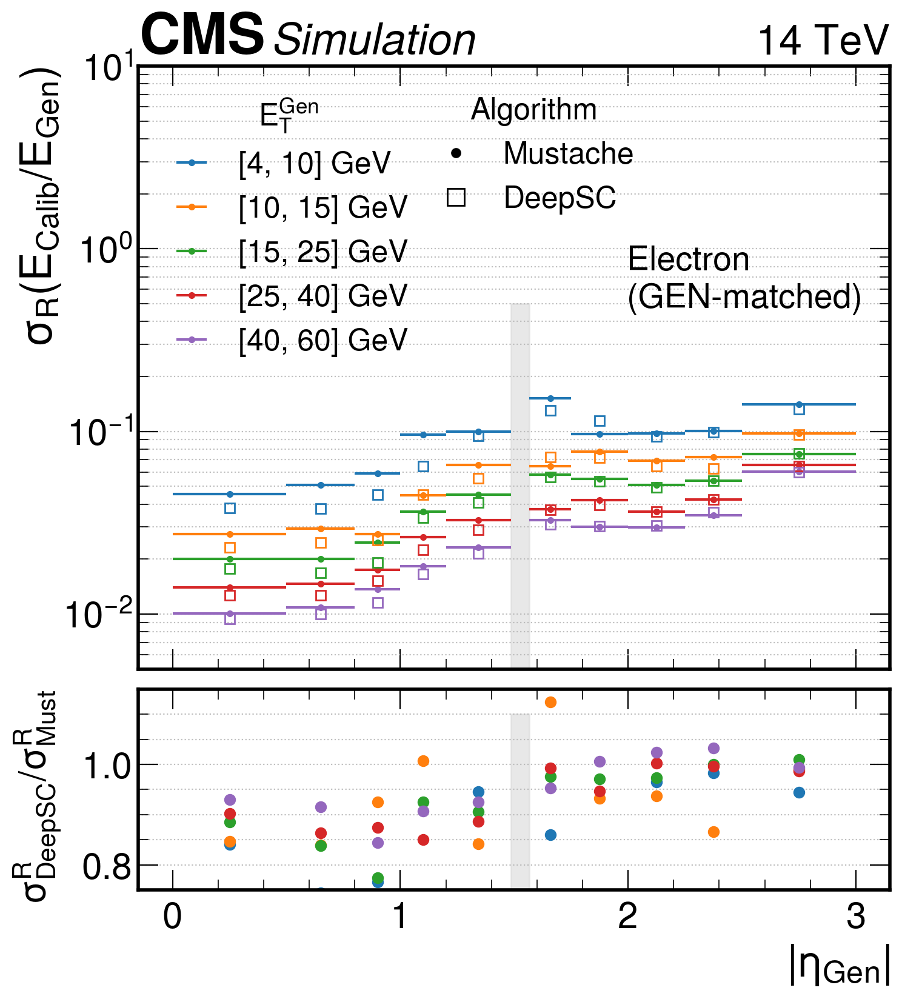

In [166]:
## Sigma LEFT plot
res_label = "$\sigma_R (E_{Calib}/E_{Gen})$"
res["w68"] = res.sigmaR
res_must["w68"] = res_must.sigmaR
#     avgenraw.reset_index(level=0, inplace=True)
#     avgenraw.reset_index(level=0, inplace=True)

fig = plt.figure(figsize=(8,9), dpi=200)
gs = fig.add_gridspec(2, hspace=0.05, height_ratios=[0.75,0.25])
axs = gs.subplots(sharex=True)

errx = []
x = []
for i in range(len(etas)-1):
    errx.append((etas[i+1]- etas[i])/2)
    x.append((etas[i+1]+ etas[i])/2)

mustl = []
deepl = []

res.loc[res.eta_bin == exclude_bin, ["w68"]] = 0
res_must.loc[res_must.eta_bin == exclude_bin, ["w68"]] = 0

for iet, et in enumerate(ets[:-1]):
    if iet not in iplot: continue
    l = axs[0].errorbar(x, res_must[res_must.et_bin == iet].w68, xerr=errx, label="[{}, {}] GeV".format(ets[iet], ets[iet+1]), fmt = ".")
    mustl.append(l)

i = 0
for iet, et in enumerate(ets[:-1]):
    if iet not in iplot: continue
    l = axs[0].errorbar(x, res[res.et_bin == iet].w68,  xerr=errx ,label="[{}, {}] GeV".format(ets[iet], ets[iet+1]), 
                            c=mustl[i].lines[0].get_color(), marker="s", markerfacecolor='none', linestyle='none',elinewidth=0)
    i+=1
    deepl.append(l)

axs[0].fill_between([1.485, 1.566], [5e-3,5e-3],[0.5,0.5], color="lightgray", alpha=0.5)

for iet, et in enumerate(ets[:-1]):
    if iet not in iplot: continue
    #v =res_must[res_must.et_bin == iet].w68**2 - res[res.et_bin == iet].w68**2
    #var = np.sqrt(np.abs(v))*np.sign(v) / res_must[res_must.et_bin == iet].w68
    var = res[res.et_bin==iet].w68 / res_must[res_must.et_bin==iet].w68
    axs[1].errorbar(x, var,xerr=errx, label="$E_T^{Gen} $" + " [{}, {}] GeV".format(ets[iet], ets[iet+1]),  fmt="o", linestyle='none', elinewidth=0)

axs[0].set_ylabel(res_label)

l1= axs[0].legend(handles=mustl, title="$E_T^{Gen}$", title_fontsize=18, loc="upper left", fontsize=18)

ml = mlines.Line2D([], [], color='black', marker='.', linestyle='None', markersize=10, label='Mustache')
dl = mlines.Line2D([], [], color='black', marker='s', markerfacecolor='none', linestyle='None', markersize=10, label='DeepSC')
axs[0].legend(handles=[ml,dl], title="Algorithm", title_fontsize=18, loc="upper right", bbox_to_anchor=(0.7, 1), fontsize=18)
axs[0].add_artist(l1)

axs[1].set_xlabel("$|\eta_{Gen}|$")
axs[0].set_ylim(5e-3,1e1)
# ax.plot([0,100],[1,1], linestyle="dashed", color="black")

axs[1].set_ylim(0.75, 1.15)
axs[1].set_ylabel("$\sigma_{DeepSC}^R/\sigma_{Must}^R$", fontsize=22)
axs[0].get_yaxis().set_label_coords(-0.1,1)
axs[1].get_yaxis().set_label_coords(-0.1,1)

axs[1].fill_between([1.485, 1.566], [-0.1,-0.1],[1.1,1.1], color="lightgray", alpha=0.5)

#     axs[1].legend(ncol=3,prop={'size': 13}, loc="lower left" )

axs[0].text(0.65, 0.6, flavour, transform=axs[0].transAxes, fontsize=20)

axs[0].set_yscale("log")
axs[0].grid(which="both",axis="y")
axs[1].grid(which="both",axis="y")

hep.cms.label(rlabel="14 TeV", loc=0, ax=axs[0])

fig.savefig(output_folder + "/resolution_byeta_{}_cruijiff_sigmaR_ratio.png".format(name))
fig.savefig(output_folder + "/resolution_byeta_{}_cruijiff_sigmaR_ratio.pdf".format(name))
fig.savefig(output_folder + "/resolution_byeta_{}_cruijiff_sigmaR_ratio.svg".format(name))


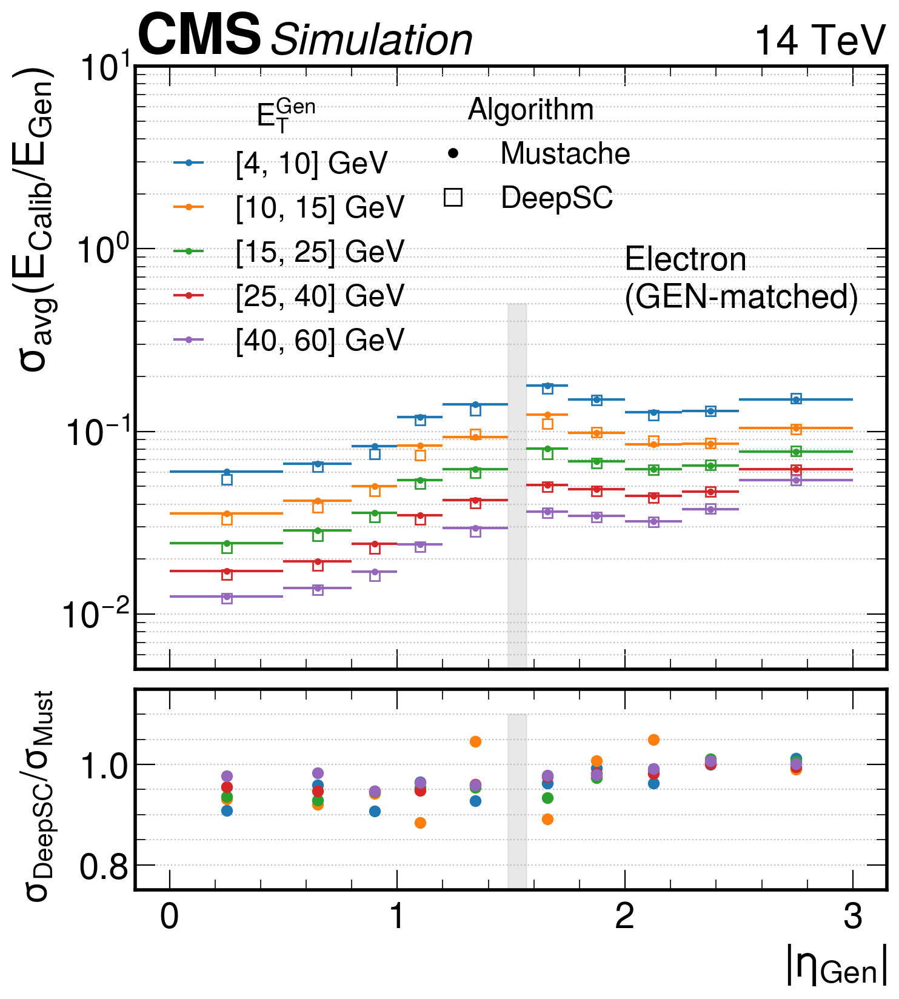

In [167]:
## Sigma LEFT plot
res_label = "$\sigma_{avg} (E_{Calib}/E_{Gen})$"
res["w68"] = (res.sigmaR+res.sigmaL)/2
res_must["w68"] = (res_must.sigmaR + res_must.sigmaL)/2
#     avgenraw.reset_index(level=0, inplace=True)
#     avgenraw.reset_index(level=0, inplace=True)

fig = plt.figure(figsize=(8,9), dpi=200)
gs = fig.add_gridspec(2, hspace=0.05, height_ratios=[0.75,0.25])
axs = gs.subplots(sharex=True)

errx = []
x = []
for i in range(len(etas)-1):
    errx.append((etas[i+1]- etas[i])/2)
    x.append((etas[i+1]+ etas[i])/2)

mustl = []
deepl = []

res.loc[res.eta_bin == exclude_bin, ["w68"]] = 0
res_must.loc[res_must.eta_bin == exclude_bin, ["w68"]] = 0

for iet, et in enumerate(ets[:-1]):
    if iet not in iplot: continue
    l = axs[0].errorbar(x, res_must[res_must.et_bin == iet].w68, xerr=errx, label="[{}, {}] GeV".format(ets[iet], ets[iet+1]), fmt = ".")
    mustl.append(l)

i = 0
for iet, et in enumerate(ets[:-1]):
    if iet not in iplot: continue
    l = axs[0].errorbar(x, res[res.et_bin == iet].w68,  xerr=errx ,label="[{}, {}] GeV".format(ets[iet], ets[iet+1]), 
                            c=mustl[i].lines[0].get_color(), marker="s", markerfacecolor='none', linestyle='none',elinewidth=0)
    i+=1
    deepl.append(l)

axs[0].fill_between([1.485, 1.566], [5e-3,5e-3],[0.5,0.5], color="lightgray", alpha=0.5)

for iet, et in enumerate(ets[:-1]):
    if iet not in iplot: continue
    #v =res_must[res_must.et_bin == iet].w68**2 - res[res.et_bin == iet].w68**2
    #var = np.sqrt(np.abs(v))*np.sign(v) / res_must[res_must.et_bin == iet].w68
    var = res[res.et_bin==iet].w68 / res_must[res_must.et_bin==iet].w68
    axs[1].errorbar(x, var,xerr=errx, label="$E_T^{Gen} $" + " [{}, {}] GeV".format(ets[iet], ets[iet+1]),  fmt="o", linestyle='none', elinewidth=0)

axs[0].set_ylabel(res_label)

l1= axs[0].legend(handles=mustl, title="$E_T^{Gen}$", title_fontsize=18, loc="upper left", fontsize=18)

ml = mlines.Line2D([], [], color='black', marker='.', linestyle='None', markersize=10, label='Mustache')
dl = mlines.Line2D([], [], color='black', marker='s', markerfacecolor='none', linestyle='None', markersize=10, label='DeepSC')
axs[0].legend(handles=[ml,dl], title="Algorithm", title_fontsize=18, loc="upper right", bbox_to_anchor=(0.7, 1), fontsize=18)
axs[0].add_artist(l1)

axs[1].set_xlabel("$|\eta_{Gen}|$")
axs[0].set_ylim(5e-3,1e1)
# ax.plot([0,100],[1,1], linestyle="dashed", color="black")

axs[1].set_ylim(0.75, 1.15)
axs[1].set_ylabel("$\sigma_{DeepSC}/\sigma_{Must}$", fontsize=22)
axs[0].get_yaxis().set_label_coords(-0.1,1)
axs[1].get_yaxis().set_label_coords(-0.1,1)

axs[1].fill_between([1.485, 1.566], [-0.1,-0.1],[1.1,1.1], color="lightgray", alpha=0.5)

#     axs[1].legend(ncol=3,prop={'size': 13}, loc="lower left" )

axs[0].text(0.65, 0.6, flavour, transform=axs[0].transAxes, fontsize=20)

axs[0].set_yscale("log")
axs[0].grid(which="both",axis="y")
axs[1].grid(which="both",axis="y")

hep.cms.label(rlabel="14 TeV", loc=0, ax=axs[0])

fig.savefig(output_folder + "/resolution_byeta_{}_cruijiff_sigmaAvg_ratio.png".format(name))
fig.savefig(output_folder + "/resolution_byeta_{}_cruijiff_sigmaAvg_ratio.pdf".format(name))
fig.savefig(output_folder + "/resolution_byeta_{}_cruijiff_sigmaAvg_ratio.svg".format(name))


### Plot by pt

In [168]:
output_folder = "/eos/user/d/dvalsecc/www/ECAL/Clustering/DeepCluster/RecoPlots/RecoComparison_regression_UL18_v8_SCregression/fits_et_eta"
os.makedirs(output_folder, exist_ok=True)

ets = [4, 8, 12,16, 20,25 ,30,35,40, 45, 50, 60, 70, 80, 90 ,100]
etas = [0, 1.485, 1.566, 3]

nbins_fit = 250
prange = 0.98
name = "ele_gen_matched_corr"
flavour = "Electron \n(GEN-matched)"
df = df_join
res_var = "Ecorr_ov_EGen"
res_label = "$\sigma (E_{Calib}/E_{Gen})$"

df["et_bin"] = pd.cut(df.calo_et_gen_new, ets, labels=list(range(len(ets)-1)))
df["eta_bin"] = pd.cut(df.seed_eta_new.abs(), etas, labels=list(range(len(etas)-1)))

# Eta restrinction

res = df_join.groupby(["et_bin","eta_bin"]).apply(bin_analysis_cruijff(f"{res_var}_new", nbins=nbins_fit, prange=prange))
res_must = df_join.groupby(["et_bin","eta_bin"]).apply(bin_analysis_cruijff(f"{res_var}_old", nbins=nbins_fit, prange=prange))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)


Fit failed
Fit failed


In [169]:
do_plot(df_join, ets, etas, output=output_folder, nbins=nbins_fit, prange=prange)

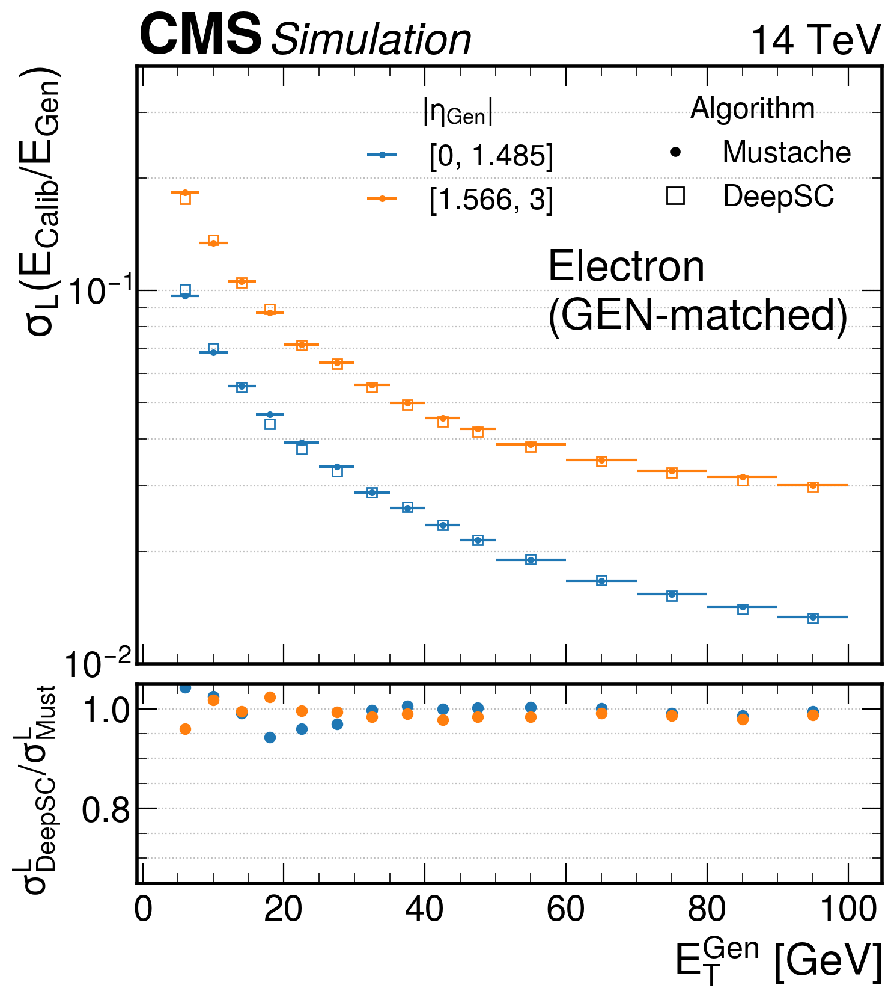

In [181]:
## Sigma LEFT plot
res_label = "$\sigma_L (E_{Calib}/E_{Gen})$"
res["w68"] = res.sigmaL
res_must["w68"] = res_must.sigmaL

exclude_bin =1
iplot= [0, 2]

fig = plt.figure(figsize=(8,9), dpi=200)
gs = fig.add_gridspec(2, hspace=0.05, height_ratios=[0.75,0.25])
axs = gs.subplots(sharex=True)

errx = []
x = []
for i in range(len(ets)-1):
    errx.append((ets[i+1]- ets[i])/2)
    x.append((ets[i+1]+ ets[i])/2)

mustl = []
deepl = []


res.loc[res.eta_bin == exclude_bin, ["w68"]] = 0
res_must.loc[res_must.eta_bin == exclude_bin, ["w68"]] = 0

for ieta, eta in enumerate(etas[:-1]):
    if ieta not in iplot: continue
    l = axs[0].errorbar(x, res_must[res_must.eta_bin == ieta].w68, xerr=errx, label="[{}, {}]".format(etas[ieta], etas[ieta+1]), fmt = ".")
    mustl.append(l)

i=0
for ieta, eta in enumerate(etas[:-1]):
    if ieta not in iplot: continue
    l = axs[0].errorbar(x, res[res.eta_bin == ieta].w68, xerr=errx,label="[{}, {}]".format(etas[ieta], etas[ieta+1]), 
                            marker="s", markerfacecolor='none', c=mustl[i].lines[0].get_color(), linestyle='none', elinewidth=0)
    i+=1
    deepl.append(l)


for ieta, eta in enumerate(etas[:-1]):
    if ieta not in iplot: continue
    var = res[res.eta_bin == ieta].w68 / res_must[res_must.eta_bin == ieta].w68
    axs[1].errorbar(x, var, xerr=errx, label="[{}, {}]".format(etas[ieta], etas[ieta+1]), fmt="o", linestyle='none', elinewidth=0 )

axs[0].set_ylabel(res_label)

axs[1].set_xlabel("$E_T^{Gen}$ [GeV]")
# ax.plot([0,100],[1,1], linestyle="dashed", color="black")
axs[0].set_ylim(1e-2, 0.4)
axs[1].set_ylim(0.65, 1.05)
axs[1].set_ylabel("$\sigma_{DeepSC}^L/\sigma_{Must}^L$", fontsize=22)
axs[0].get_yaxis().set_label_coords(-0.1,1)
axs[1].get_yaxis().set_label_coords(-0.1,1)
#     axs[1].legend(ncol=2, loc="upper right", fontsize=15)

axs[0].text(0.55, 0.56, flavour, transform=axs[0].transAxes)
axs[0].set_yscale("log")

l1= axs[0].legend(handles=mustl, title="$|\eta_{Gen}|$", title_fontsize=18, loc="upper right", bbox_to_anchor=(0.6, 1), fontsize=18)

ml = mlines.Line2D([], [], color='black', marker='.', linestyle='None', markersize=10, label='Mustache')
dl = mlines.Line2D([], [], color='black', marker='s', markerfacecolor='none', linestyle='None', markersize=10, label='DeepSC')
axs[0].legend(handles=[ml,dl], title="Algorithm", title_fontsize=18, loc="upper right", fontsize=18)
axs[0].add_artist(l1)
axs[1].grid(axis="y",which="both")
axs[0].grid(axis="y", which="both")

hep.cms.label(rlabel="14 TeV", loc=0, ax=axs[0])

fig.savefig(output_folder + "/resolution_byEt_{}_cruijiff_sigmaL_ratio.png".format(name))
fig.savefig(output_folder + "/resolution_byEt_{}_cruijiff_sigmaL_ratio.pdf".format(name))
fig.savefig(output_folder + "/resolution_byEt_{}_cruijiff_sigmaL_ratio.svg".format(name))

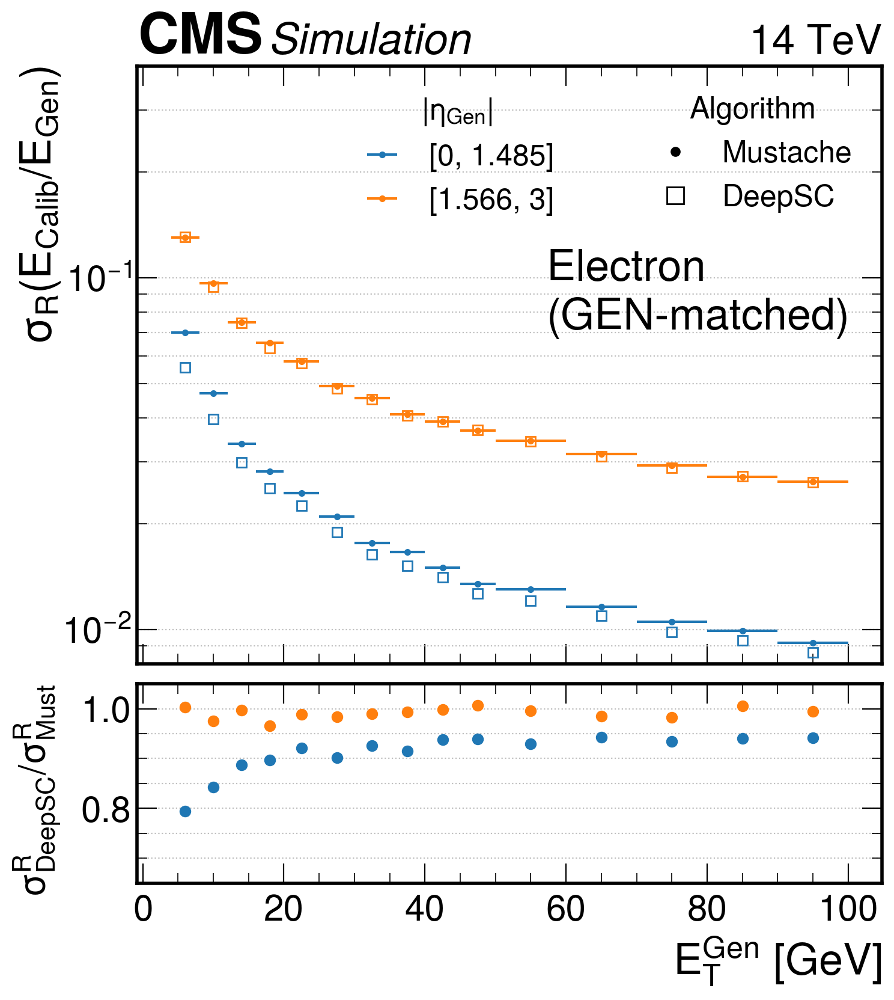

In [189]:
## Sigma LEFT plot
res_label = "$\sigma_R (E_{Calib}/E_{Gen})$"
res["w68"] = res.sigmaR
res_must["w68"] = res_must.sigmaR

exclude_bin =1
iplot= [0, 2]

fig = plt.figure(figsize=(8,9), dpi=200)
gs = fig.add_gridspec(2, hspace=0.05, height_ratios=[0.75,0.25])
axs = gs.subplots(sharex=True)

errx = []
x = []
for i in range(len(ets)-1):
    errx.append((ets[i+1]- ets[i])/2)
    x.append((ets[i+1]+ ets[i])/2)

mustl = []
deepl = []


res.loc[res.eta_bin == exclude_bin, ["w68"]] = 0
res_must.loc[res_must.eta_bin == exclude_bin, ["w68"]] = 0

for ieta, eta in enumerate(etas[:-1]):
    if ieta not in iplot: continue
    l = axs[0].errorbar(x, res_must[res_must.eta_bin == ieta].w68, xerr=errx, label="[{}, {}]".format(etas[ieta], etas[ieta+1]), fmt = ".")
    mustl.append(l)

i=0
for ieta, eta in enumerate(etas[:-1]):
    if ieta not in iplot: continue
    l = axs[0].errorbar(x, res[res.eta_bin == ieta].w68, xerr=errx,label="[{}, {}]".format(etas[ieta], etas[ieta+1]), 
                            marker="s", markerfacecolor='none', c=mustl[i].lines[0].get_color(), linestyle='none', elinewidth=0)
    i+=1
    deepl.append(l)


for ieta, eta in enumerate(etas[:-1]):
    if ieta not in iplot: continue
    var = res[res.eta_bin == ieta].w68 / res_must[res_must.eta_bin == ieta].w68
    axs[1].errorbar(x, var, xerr=errx, label="[{}, {}]".format(etas[ieta], etas[ieta+1]), fmt="o", linestyle='none', elinewidth=0 )

axs[0].set_ylabel(res_label)

axs[1].set_xlabel("$E_T^{Gen}$ [GeV]")
# ax.plot([0,100],[1,1], linestyle="dashed", color="black")
axs[0].set_ylim(8e-3, 0.4)
axs[1].set_ylim(0.65, 1.05)
axs[1].set_ylabel("$\sigma_{DeepSC}^R/\sigma_{Must}^R$", fontsize=22)
axs[0].get_yaxis().set_label_coords(-0.1,1)
axs[1].get_yaxis().set_label_coords(-0.1,1)
#     axs[1].legend(ncol=2, loc="upper right", fontsize=15)

axs[0].text(0.55, 0.56, flavour, transform=axs[0].transAxes)
axs[0].set_yscale("log")

l1= axs[0].legend(handles=mustl, title="$|\eta_{Gen}|$", title_fontsize=18, loc="upper right", bbox_to_anchor=(0.6, 1), fontsize=18)

ml = mlines.Line2D([], [], color='black', marker='.', linestyle='None', markersize=10, label='Mustache')
dl = mlines.Line2D([], [], color='black', marker='s', markerfacecolor='none', linestyle='None', markersize=10, label='DeepSC')
axs[0].legend(handles=[ml,dl], title="Algorithm", title_fontsize=18, loc="upper right", fontsize=18)
axs[0].add_artist(l1)
axs[1].grid(axis="y",which="both")
axs[0].grid(axis="y", which="both")

hep.cms.label(rlabel="14 TeV", loc=0, ax=axs[0])

fig.savefig(output_folder + "/resolution_byEt_{}_cruijiff_sigmaR_ratio.png".format(name))
fig.savefig(output_folder + "/resolution_byEt_{}_cruijiff_sigmaR_ratio.pdf".format(name))
fig.savefig(output_folder + "/resolution_byEt_{}_cruijiff_sigmaR_ratio.svg".format(name))

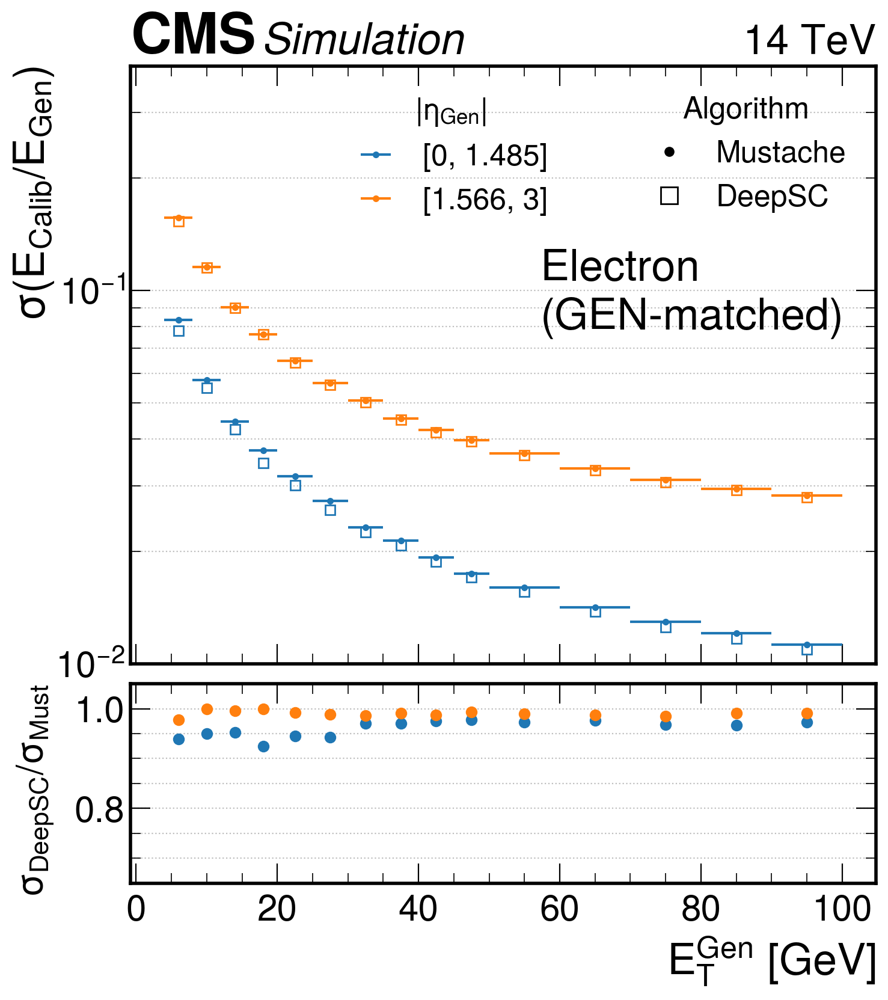

In [187]:
## Sigma LEFT plot
res_label = "$\sigma (E_{Calib}/E_{Gen})$"
res["w68"] = (res.sigmaR+res.sigmaL)/2
res_must["w68"] = (res_must.sigmaR+res_must.sigmaL)/2

exclude_bin =1
iplot= [0, 2]

fig = plt.figure(figsize=(8,9), dpi=200)
gs = fig.add_gridspec(2, hspace=0.05, height_ratios=[0.75,0.25])
axs = gs.subplots(sharex=True)

errx = []
x = []
for i in range(len(ets)-1):
    errx.append((ets[i+1]- ets[i])/2)
    x.append((ets[i+1]+ ets[i])/2)

mustl = []
deepl = []


res.loc[res.eta_bin == exclude_bin, ["w68"]] = 0
res_must.loc[res_must.eta_bin == exclude_bin, ["w68"]] = 0

for ieta, eta in enumerate(etas[:-1]):
    if ieta not in iplot: continue
    l = axs[0].errorbar(x, res_must[res_must.eta_bin == ieta].w68, xerr=errx, label="[{}, {}]".format(etas[ieta], etas[ieta+1]), fmt = ".")
    mustl.append(l)

i=0
for ieta, eta in enumerate(etas[:-1]):
    if ieta not in iplot: continue
    l = axs[0].errorbar(x, res[res.eta_bin == ieta].w68, xerr=errx,label="[{}, {}]".format(etas[ieta], etas[ieta+1]), 
                            marker="s", markerfacecolor='none', c=mustl[i].lines[0].get_color(), linestyle='none', elinewidth=0)
    i+=1
    deepl.append(l)


for ieta, eta in enumerate(etas[:-1]):
    if ieta not in iplot: continue
    var = res[res.eta_bin == ieta].w68 / res_must[res_must.eta_bin == ieta].w68
    axs[1].errorbar(x, var, xerr=errx, label="[{}, {}]".format(etas[ieta], etas[ieta+1]), fmt="o", linestyle='none', elinewidth=0 )

axs[0].set_ylabel(res_label)

axs[1].set_xlabel("$E_T^{Gen}$ [GeV]")
# ax.plot([0,100],[1,1], linestyle="dashed", color="black")
axs[0].set_ylim(1e-2, 0.4)
axs[1].set_ylim(0.65, 1.05)
axs[1].set_ylabel("$\sigma_{DeepSC}/\sigma_{Must}$", fontsize=22)
axs[0].get_yaxis().set_label_coords(-0.1,1)
axs[1].get_yaxis().set_label_coords(-0.1,1)
#     axs[1].legend(ncol=2, loc="upper right", fontsize=15)

axs[0].text(0.55, 0.56, flavour, transform=axs[0].transAxes)
axs[0].set_yscale("log")

l1= axs[0].legend(handles=mustl, title="$|\eta_{Gen}|$", title_fontsize=18, loc="upper right", bbox_to_anchor=(0.6, 1), fontsize=18)

ml = mlines.Line2D([], [], color='black', marker='.', linestyle='None', markersize=10, label='Mustache')
dl = mlines.Line2D([], [], color='black', marker='s', markerfacecolor='none', linestyle='None', markersize=10, label='DeepSC')
axs[0].legend(handles=[ml,dl], title="Algorithm", title_fontsize=18, loc="upper right", fontsize=18)
axs[0].add_artist(l1)
axs[1].grid(axis="y",which="both")
axs[0].grid(axis="y", which="both")

hep.cms.label(rlabel="14 TeV", loc=0, ax=axs[0])

fig.savefig(output_folder + "/resolution_byEt_{}_cruijiff_sigmaAvg_ratio.png".format(name))
fig.savefig(output_folder + "/resolution_byEt_{}_cruijiff_sigmaAvg_ratio.pdf".format(name))
fig.savefig(output_folder + "/resolution_byEt_{}_cruijiff_sigmaAvg_ratio.svg".format(name))

### Resolution by PU

In [20]:
nvtx = [30,60,70,80,90,120]
ets = [1,8,15,30,60]
iplot =[0,1,3]
nbins_fit = 300
prange = 0.95

name = "ele_gen_matched_corr"
flavour = "Electron \n(GEN-matched)"
df = df_join
res_var = "Ecorr_ov_EGen"
res_label = "$\sigma (E_{Calib}/E_{Gen})$"


df["et_bin"] = pd.cut(df.calo_et_gen_new, ets, labels=list(range(len(ets)-1)))
df["nvtx_bin"] = pd.cut(df.obsPU_new, nvtx, labels=list(range(len(nvtx)-1)))

res = df_join.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis_cruijff(f"{res_var}_new", nbins=nbins_fit, prange=prange))
res_must = df_join.groupby(["nvtx_bin","et_bin"]).apply(bin_analysis_cruijff(f"{res_var}_old", nbins=nbins_fit, prange=prange))
res.reset_index(level=0, inplace=True)
res.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)
res_must.reset_index(level=0, inplace=True)

Fit failed
Fit failed


In [21]:
def do_plot_nvtx(df_join, ets, nvtx, output, nbins=300, prange=0.9):
    for iet in range(len(ets)-1):
        for invt in range(len(nvtx)-1):
            df = df_join[(df_join.et_bin == iet)&(df_join.nvtx_bin==invt)]
            fit_deep = bin_analysis_cruijff(f"{res_var}_new", nbins=nbins, prange=prange)
            fit_must = bin_analysis_cruijff(f"{res_var}_old", nbins=nbins, prange=prange)
            try:
                res_deep = fit_deep(df)
                res_must = fit_must(df)
            except:
                print(f"Fit failed et=[{ets[iet]},{ets[iet+1]}], eta=[{etas[ieta]},{etas[ieta+1]}]")
                return

            fig = plt.figure(figsize=(9,8), dpi=100)
            ax = plt.gca()



            H_m = np.histogram(df[f"{res_var}_old"],bins=nbins, range=(res_must.xmin, res_must.xmax))
            xm = H_m[1][:-1]
            Ym = H_m[0]
            ax.errorbar(xm, Ym, np.sqrt(Ym),0, linestyle='none',fmt=".", label="Mustache")


            H_d = np.histogram(df[f"{res_var}_new"],bins=nbins, range=(res_deep.xmin, res_deep.xmax))
            xd = H_d[1][:-1]
            Yd = H_d[0]
            ax.errorbar(xd, Yd, np.sqrt(Yd),0, linestyle='none', fmt=".",label="DeepSC")


            y_cr_D = cruijff(xd, res_deep.A, res_deep.m, res_deep.sigmaL, res_deep.sigmaR, res_deep.alphaL, res_deep.alphaR)
            y_cr_M = cruijff(xm, res_must.A, res_must.m, res_must.sigmaL, res_must.sigmaR, res_must.alphaL, res_must.alphaR)
            ax.plot(xm, y_cr_M, label="Cruijiff Mustache", linewidth=2)
            ax.plot(xd, y_cr_D, label="Cruijiff DeepSC", linewidth =2)

            ax.legend(loc="upper right", bbox_to_anchor=(1, 1), fontsize=18)


            ax.text(0.05, 0.9, f"DeepSC:\nm={res_deep.m:.3f}, $\sigma_L$={res_deep.sigmaL:.3f}, $\sigma_R$={res_deep.sigmaR:.3f}",
                    transform=ax.transAxes, fontsize=15, color="orange")
            ax.text(0.05, 0.8, f"Mustache:\nm={res_must.m:.3f}, $\sigma_L$={res_must.sigmaL:.3f}, $\sigma_R$={res_must.sigmaR:.3f}",
                    transform=ax.transAxes, fontsize=15, color="blue")

            ax.text(0.05, 0.65, f"$E_T^{{Gen}}$ [{ets[iet]},{ets[iet+1]}] GeV\n$PU_{{obs}}$: [{nvtx[invt]},{nvtx[invt+1]}]",
                    transform=ax.transAxes, fontsize=17)

            ax.set_ylim(0,max(Yd)*1.3)

            ax.set_xlabel("$E_{calib}/E_{Gen}$")

            hep.cms.label(rlabel="14 TeV", loc=0, ax=ax)

            if (output):
                fig.savefig(output + f"/cruijff_fit_EcorrOvEGen_et{ets[iet]}_{ets[iet+1]}_nvtx{nvtx[invt]}_{nvtx[invt+1]}.png")
                fig.savefig(output + f"/cruijff_fit_EcorrOvEGen_et{ets[iet]}_{ets[iet+1]}_nvtx{nvtx[invt]}_{nvtx[invt+1]}.pdf")
                fig.savefig(output + f"/cruijff_fit_EcorrOvEGen_et{ets[iet]}_{ets[iet+1]}_nvtx{nvtx[invt]}_{nvtx[invt+1]}.svg")
            plt.close()

In [23]:
output_folder = "/eos/user/d/dvalsecc/www/ECAL/Clustering/DeepCluster/RecoPlots/RecoComparison_regression_UL18_v8_SCregression/fits_pu_et"
os.makedirs(output_folder, exist_ok=True)

do_plot_nvtx(df_join, ets, nvtx, output=output_folder, nbins=nbins_fit, prange=prange)

Fit failed
Fit failed
